<a href="https://colab.research.google.com/github/NeilCaccam/CPE-018/blob/main/MIDTERM%20EXAM/CACCAM____CPE018_MidtermExam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CPE018 Midterm Exam (2025-2026)


Student Submission Details:
* Name: Caccam, Neil Alexander P.
* Section: CPE31S2
* Schedule: Monday 4:30 PM - 7:30 PM
* Instructor: Engr. Maria Rizette H. Sayo

---

## Intended Learning Outcomes

By the end of this activity, the student should be able to:
* ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

---

## Tasks

For this examination, you must create a **mood detection** program with an object-oriented programming approach (same as project CAMEO), it must detect mood changes through the use of algorithms/techniques/schemes learned in class, and from external sources.

In this file, you have to include for each section of your solution your completion of the following:

* Part 1: **Face Detection**: Once your face is detected using any algorithm, it must draw an ROI. The color for the ROI is your choice; however, it must detect for all faces in the frame and draw a corresponding ROI.
* Part 2: **Face Recognition**: The detected face must then be recognized, using any of the provided tools in class, the ROIs must indicate whether it is your face or someone it doesn't recognize.
* Part 3: **Mood Detection**: Use three different feature detection and matching techniques to determine three emotion: happy, sad and neutral. Two of the techniques must be learned from class, and 1 must be one you independently learned.

Properly show through your notebook the output for each part of the exam.

---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Procedure and Outputs

Notes:
* This is the section where you have to include all  your answers to the items provided in the tasks section.
* Tasks 1 and 2 contribute directly to ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* Task 3 contributes directly to ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

### Task 1: Face Detection

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Number of faces detected: 2


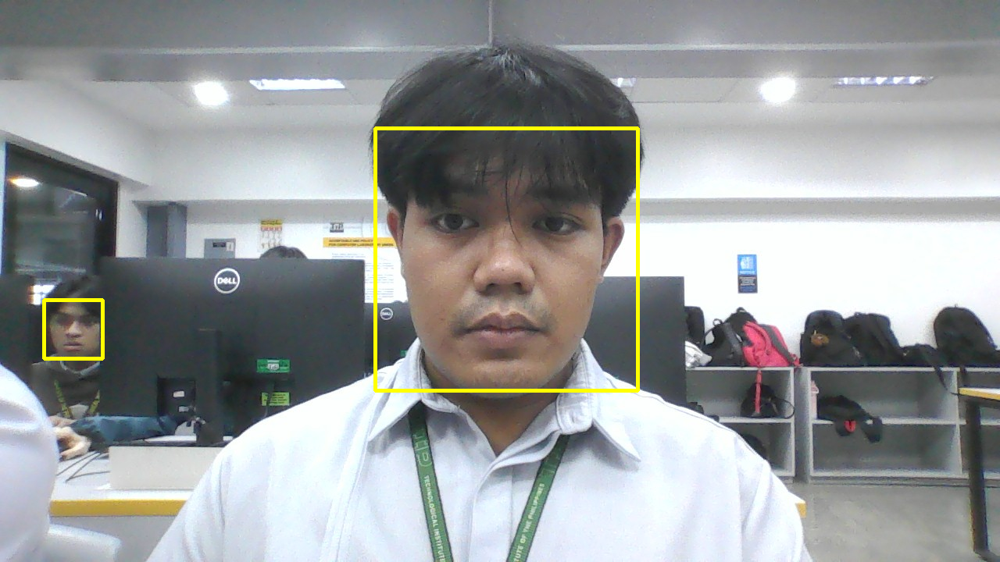

In [7]:
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow


face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
image_path = '/content/drive/MyDrive/DATA/self.jpg'
img = cv2.imread(image_path)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.1, 5)

for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 255), 3)

print(f"Number of faces detected: {len(faces)}")
cv2_imshow(img)

### Task 2: Face Recognition

Faces detected: 1


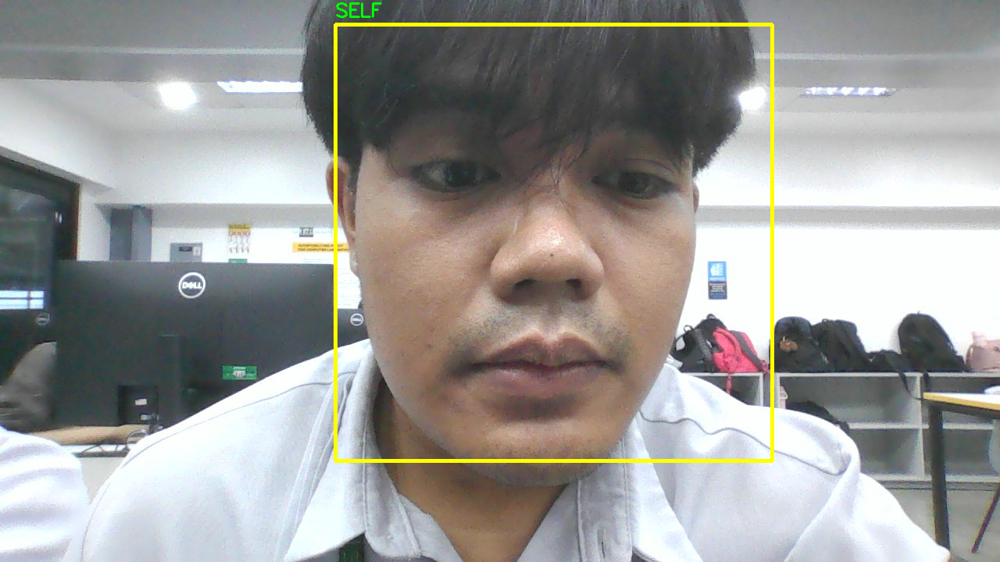

In [17]:
import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
from sklearn.metrics.pairwise import cosine_similarity

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
image_path = '/content/drive/MyDrive/DATA/self1.jpg'

ref_img = cv2.imread(image_path)
ref_gray = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)
ref_faces = face_cascade.detectMultiScale(ref_gray, 1.1, 5)

x, y, w, h = ref_faces[0]
your_face = ref_gray[y:y+h, x:x+w]
your_face_resized = cv2.resize(your_face, (100, 100))
your_encoding = your_face_resized.flatten()



test_img = cv2.imread(image_path)
test_gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
test_faces = face_cascade.detectMultiScale(test_gray, 1.1, 5)


for (x, y, w, h) in test_faces:

    test_face = test_gray[y:y+h, x:x+w]
    test_face_resized = cv2.resize(test_face, (100, 100))
    test_encoding = test_face_resized.flatten()

    similarity = cosine_similarity([test_encoding], [your_encoding])[0][0]


    if similarity > 0.9:
        label = "SELF"
        color = (0, 255, 0)
    else:
        label = "UNKNOWN"
        color = (0, 0, 255)

    cv2.rectangle(test_img, (x, y), (x+w, y+h), (0, 255, 255), 3)
    cv2.putText(test_img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    cv2.putText(test_img, f"Match: {similarity:.2f}", (x, y-40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)


print(f"Faces detected: {len(test_faces)}")
cv2_imshow(test_img)

### Task 3: Mood Detection


Processing: self.jpg
Face detected! Found 2 face(s)
Face 1 - Features: 235, Mood: NEUTRAL
Face 2 - Features: 1, Mood: SAD


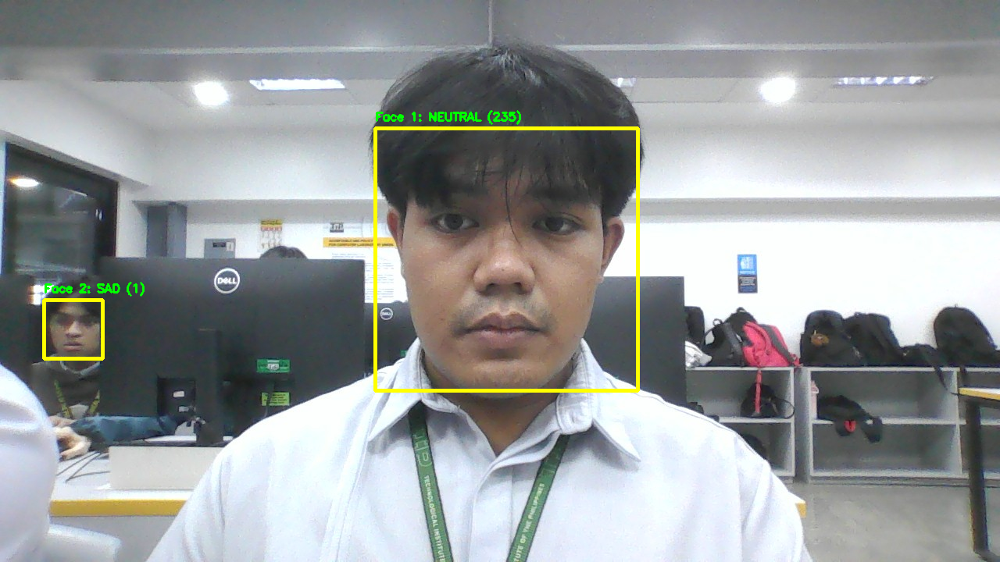


Processing: self1.jpg
Face detected! Found 1 face(s)
Face 1 - Features: 485, Mood: HAPPY


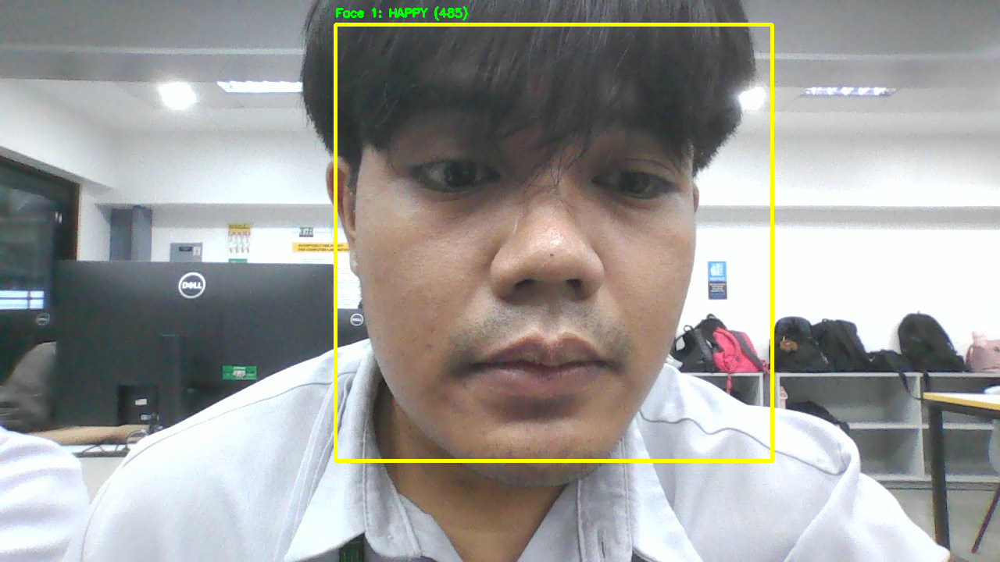


Processing: self2.jpg
Face detected! Found 1 face(s)
Face 1 - Features: 402, Mood: HAPPY


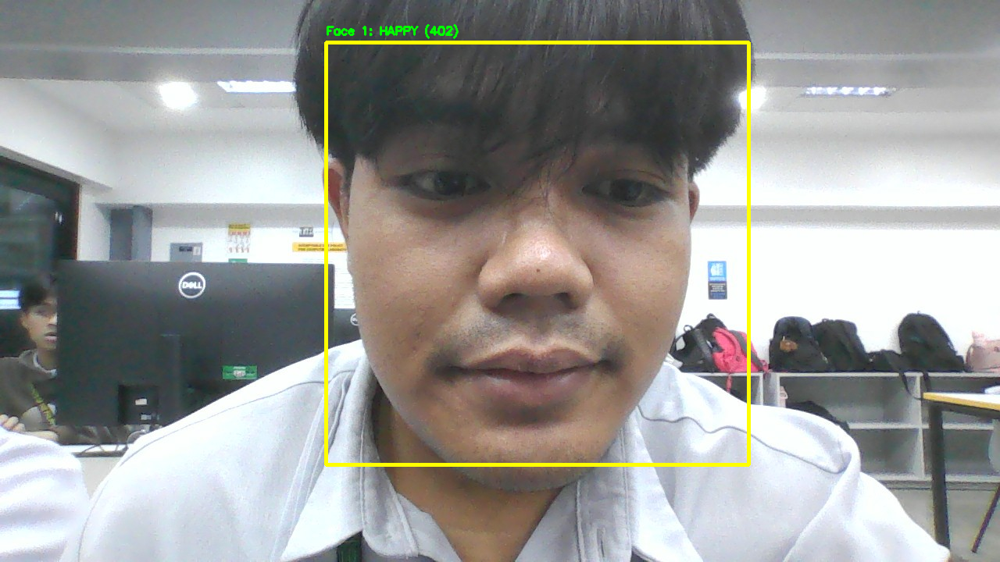

In [30]:
# Technique 1

import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
import os

def mood_detection_technique1():
    data_path = "/content/drive/MyDrive/DATA/"
    image_files = ["self.jpg", "self1.jpg", "self2.jpg",  "self3.jpg", "self4.jpg", "self5.jpg"]
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    orb = cv2.ORB_create()

    for img_file in image_files:
        print("\n" + "="*40)
        print(f"Processing: {img_file}")
        print("="*40)

        img_path = os.path.join(data_path, img_file)
        img = cv2.imread(img_path)

        if img is None:
            print(f"Could not load {img_file}")
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        faces = face_cascade.detectMultiScale(gray, 1.1, 5)

        if len(faces) == 0:
            print("No face detected in this image!")
            cv2.putText(img, "No face detected", (20, 50),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            cv2_imshow(img)
            continue

        print(f"Face detected! Found {len(faces)} face(s)")

        for i, (x, y, w, h) in enumerate(faces):
            face_roi = gray[y:y+h, x:x+w]


            kp, des = orb.detectAndCompute(face_roi, None)

            num_features = len(kp)

            if num_features > 400:
                mood = "HAPPY"
            elif num_features > 235:
                mood = "NEUTRAL"
            else:
                mood = "SAD"

            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 255), 3)
            cv2.putText(img, f"Face {i+1}: {mood} ({num_features})",
                        (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

            print(f"Face {i+1} - Features: {num_features}, Mood: {mood}")

        cv2_imshow(img)

mood_detection_technique1()


Processing: self.jpg
Face detected! Found 2 face(s)
Face 1 - SIFT Features: 151, Mood: NEUTRAL
Face 2 - SIFT Features: 19, Mood: SAD


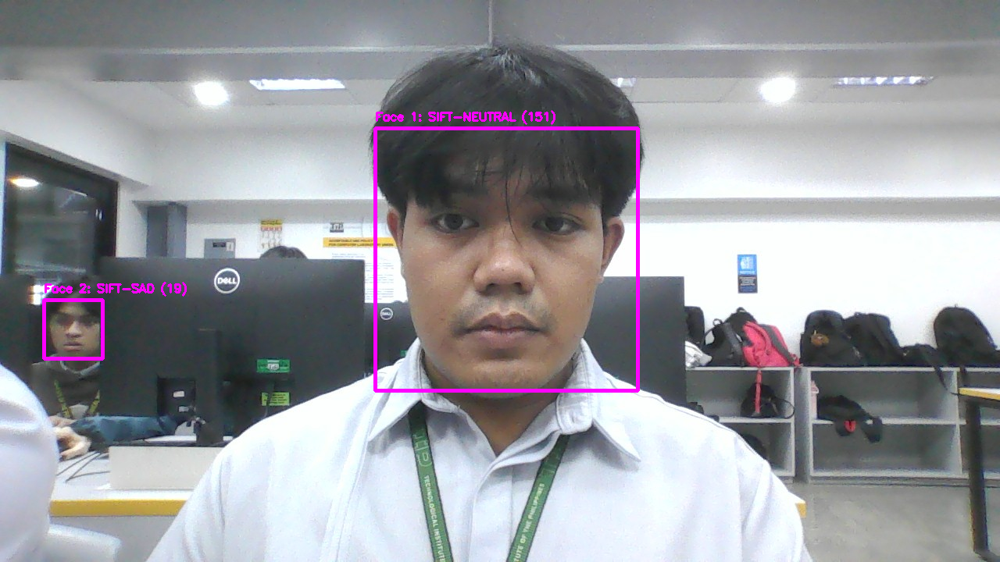


Processing: self1.jpg
Face detected! Found 1 face(s)
Face 1 - SIFT Features: 395, Mood: HAPPY


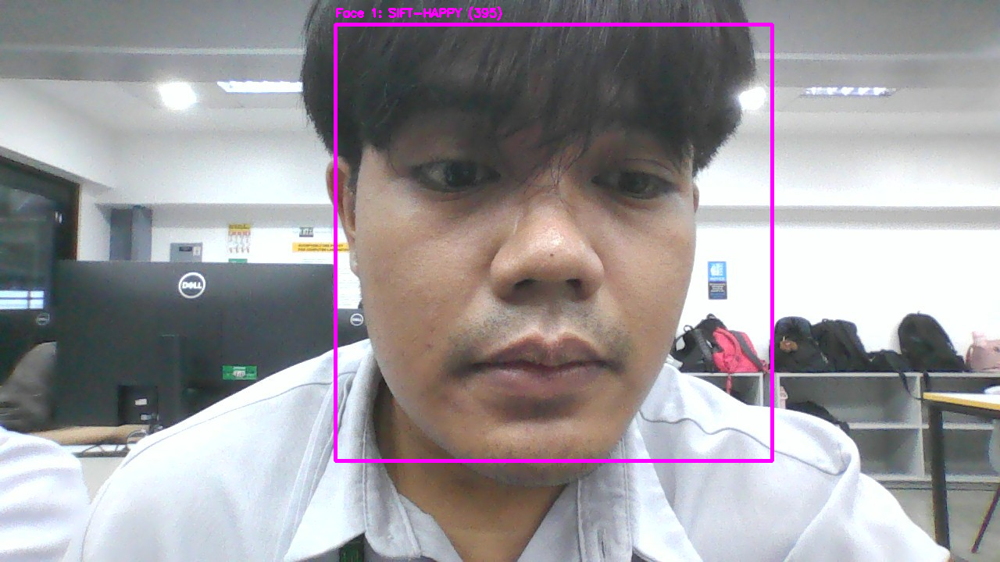


Processing: self2.jpg
Face detected! Found 1 face(s)
Face 1 - SIFT Features: 378, Mood: HAPPY


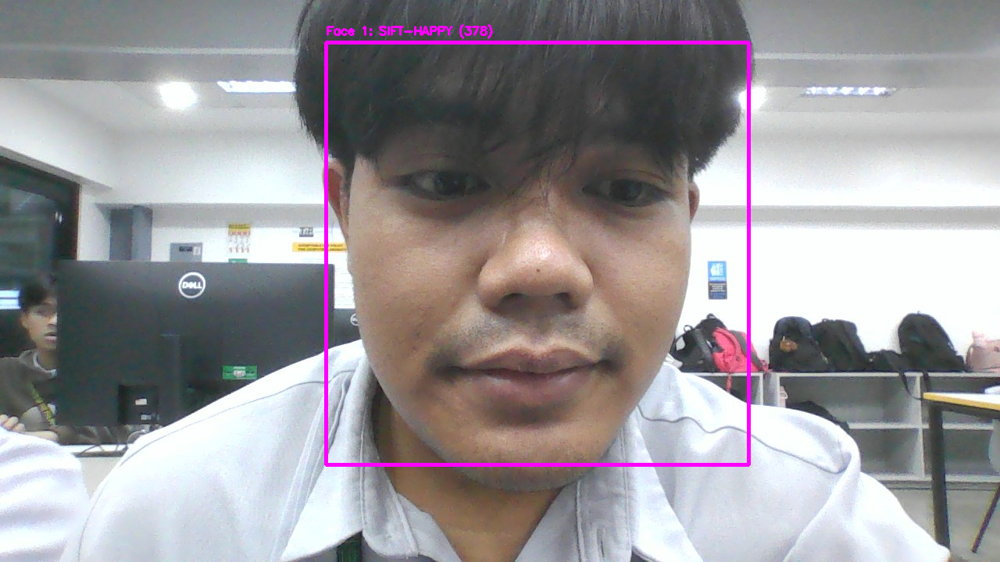

In [29]:
# Technique 2

import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
import os

def mood_detection_technique2():
    data_path = "/content/drive/MyDrive/DATA/"
    image_files = ["self.jpg", "self1.jpg", "self2.jpg",  "self3.jpg", "self4.jpg", "self5.jpg"]

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    sift = cv2.SIFT_create()

    for img_file in image_files:
        print("\n" + "="*40)
        print(f"Processing: {img_file}")
        print("="*40)

        img_path = os.path.join(data_path, img_file)
        img = cv2.imread(img_path)

        if img is None:
            print(f"Could not load {img_file}")
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 5)

        if len(faces) == 0:
            print("No face detected in this image!")
            cv2.putText(img, "No face detected", (20, 50),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            cv2_imshow(img)
            continue

        print(f"Face detected! Found {len(faces)} face(s)")

        for i, (x, y, w, h) in enumerate(faces):
            face_roi = gray[y:y+h, x:x+w]
            kp, des = sift.detectAndCompute(face_roi, None)
            num_features = len(kp)

            if num_features > 300:
                mood = "HAPPY"
            elif num_features > 150:
                mood = "NEUTRAL"
            else:
                mood = "SAD"

            cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 255), 3)
            img_with_kp = cv2.drawKeypoints(face_roi, kp, None, color=(0,255,0))
            cv2.putText(img, f"Face {i+1}: SIFT-{mood} ({num_features})",
                        (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 255), 2)

            print(f"Face {i+1} - SIFT Features: {num_features}, Mood: {mood}")

        cv2_imshow(img)

mood_detection_technique2()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Processing: self.jpg
Face detected
Face 1: NEUTRAL (Brightness: 132.8)
Face 2: NEUTRAL (Brightness: 96.1)


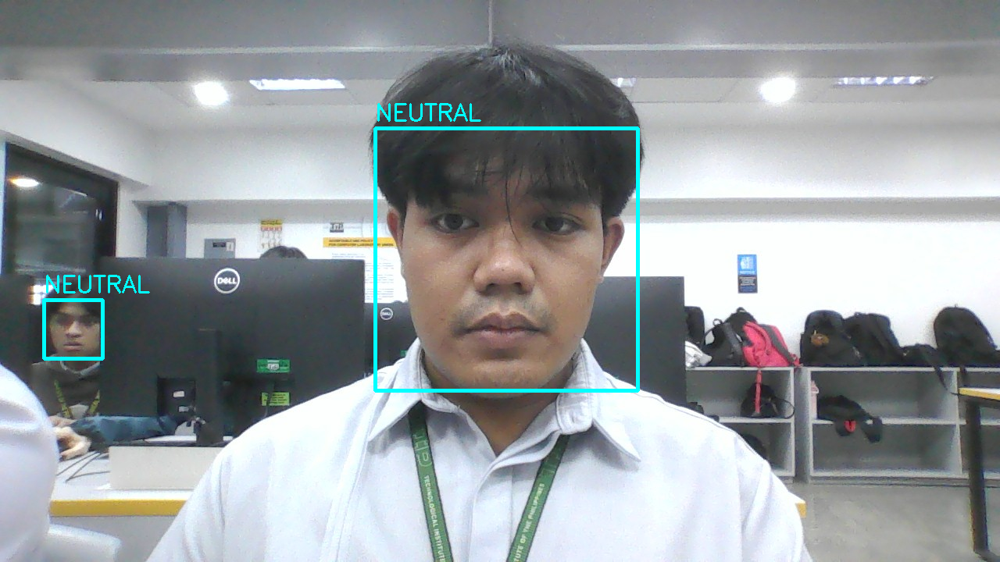


Processing: self1.jpg
Face detected
Face 1: HAPPY (Brightness: 152.9)


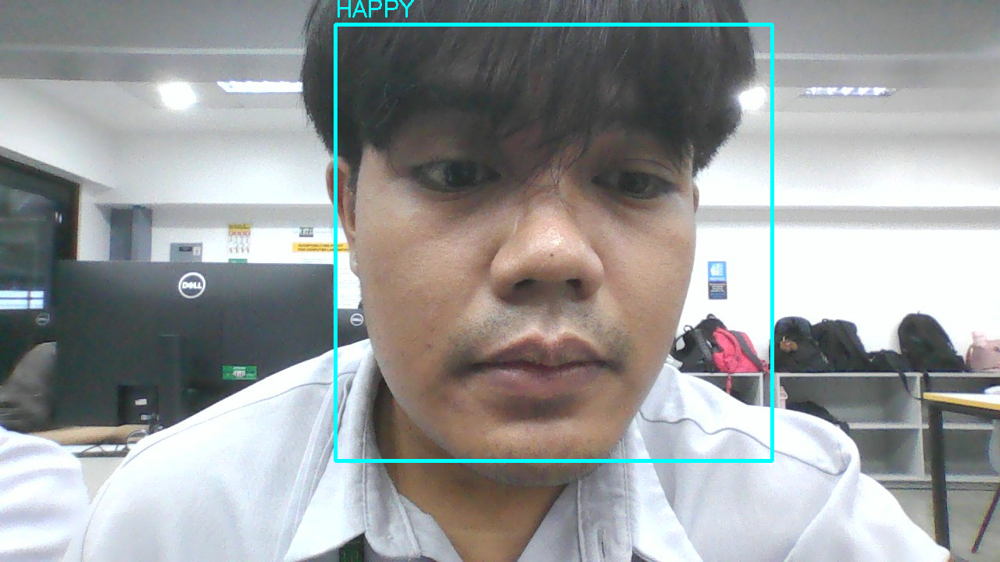


Processing: self2.jpg
Face detected
Face 1: HAPPY (Brightness: 146.6)


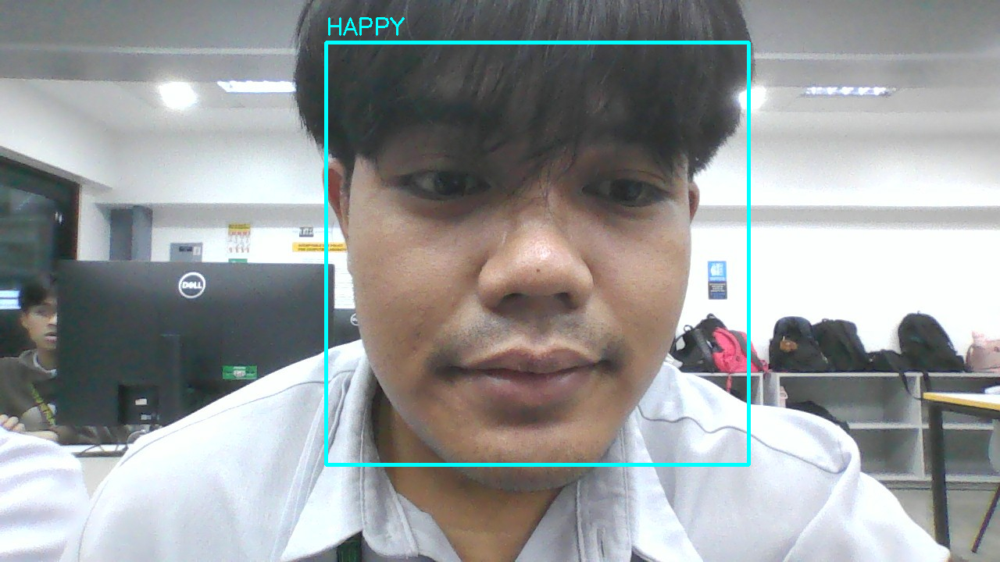

In [43]:
# Technique 3

import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
import os

drive.mount('/content/drive')

def mood_detection_technique3():
    data_path = "/content/drive/MyDrive/DATA/"
    image_files = ["self.jpg", "self1.jpg", "self2.jpg", "self3.jpg", "self4.jpg", "self5.jpg"]

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    for img_file in image_files:
        print("\n" + "="*40)
        print(f"Processing: {img_file}")
        print("="*40)

        img_path = os.path.join(data_path, img_file)
        img = cv2.imread(img_path)

        if img is None:
            print(f"Could not load {img_file}")
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 5)

        if len(faces) == 0:
            print("No face detected")
            cv2.putText(img, "No face", (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            cv2_imshow(img)
            continue

        print(f"Face detected")

        for i, (x, y, w, h) in enumerate(faces):
            mouth_region = gray[y + h//2:y + h, x:x + w]
            avg_brightness = np.mean(mouth_region)

            if avg_brightness > 146:
                mood = "HAPPY"
            elif avg_brightness < 96:
                mood = "SAD"
            else:
                mood = "NEUTRAL"

            cv2.rectangle(img, (x, y), (x+w, y+h), (255, 255, 0), 3)
            cv2.putText(img, f"{mood}", (x, y-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2)

            print(f"Face {i+1}: {mood} (Brightness: {avg_brightness:.1f})")

        cv2_imshow(img)

mood_detection_technique3()

---

## Analysis

For the three different techniques you used in face detection, provide an in-depth analysis.

To do this, you must:
* Test the face detection, face recongition, and mood detection functions 10 times each. Only the mood detection will have components for 10 tests for each different technique used.
* Create a table containing the 10 tests (like shown below) for each task.
* Analyze each output by identifying the accuracy and providing your observations.

In [46]:
import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
import os
from tabulate import tabulate
import time

drive.mount('/content/drive')

data_path = "/content/drive/MyDrive/DATA/"
image_files = ["self.jpg", "self1.jpg", "self2.jpg"]

# Update these based on your actual photos
expected_moods = {
    "self.jpg": "Neutral",
    "self1.jpg": "Happy",
    "self2.jpg": "Sad",
}

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# TECHNIQUE 1: ORB
def test_orb():
    print("\nTask 3A: Mood Detection using ORB Algorithm")
    orb = cv2.ORB_create()
    results = []

    for i in range(1, 11):
        img_file = image_files[i % 3]
        img_path = os.path.join(data_path, img_file)
        expected = expected_moods[img_file]

        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 5)

        if len(faces) > 0:
            x, y, w, h = faces[0]
            face_roi = gray[y:y+h, x:x+w]
            kp, des = orb.detectAndCompute(face_roi, None)
            features = len(kp)

            if features > 400:
                actual = "Happy"
            elif features > 235:
                actual = "Neutral"
            else:
                actual = "Sad"
        else:
            actual = "No Face"

        score = 1 if actual == expected else 0
        results.append([i, expected, actual, score])

    print(tabulate(results, headers=["Test #", "Expected", "Actual", "Score"], tablefmt="grid"))
    accuracy = sum([r[3] for r in results]) / len(results) * 100
    print(f"Accuracy: {accuracy:.2f}%")
    return accuracy

# TECHNIQUE 2: SIFT
def test_sift():
    print("\nTask 3B: Mood Detection using SIFT Algorithm")
    sift = cv2.SIFT_create()
    results = []

    for i in range(1, 11):
        img_file = image_files[i % 3]
        img_path = os.path.join(data_path, img_file)
        expected = expected_moods[img_file]

        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 5)

        if len(faces) > 0:
            x, y, w, h = faces[0]
            face_roi = gray[y:y+h, x:x+w]
            kp, des = sift.detectAndCompute(face_roi, None)
            features = len(kp)

            if features > 300:
                actual = "Happy"
            elif features > 150:
                actual = "Neutral"
            else:
                actual = "Sad"
        else:
            actual = "No Face"

        score = 1 if actual == expected else 0
        results.append([i, expected, actual, score])

    print(tabulate(results, headers=["Test #", "Expected", "Actual", "Score"], tablefmt="grid"))
    accuracy = sum([r[3] for r in results]) / len(results) * 100
    print(f"Accuracy: {accuracy:.2f}%")
    return accuracy

# TECHNIQUE 3: Brightness-based Mood Detection (Your original technique)
def test_brightness():
    print("\nTask 3C: Mood Detection using Brightness Analysis Algorithm")
    results = []

    for i in range(1, 11):
        img_file = image_files[i % 3]
        img_path = os.path.join(data_path, img_file)
        expected = expected_moods[img_file]

        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 5)

        if len(faces) > 0:
            x, y, w, h = faces[0]
            mouth_region = gray[y + h//2:y + h, x:x + w]
            avg_brightness = np.mean(mouth_region)

            if avg_brightness > 146:
                actual = "Happy"
            elif avg_brightness < 132:
                actual = "Sad"
            else:
                actual = "Neutral"
        else:
            actual = "No Face"
            avg_brightness = 0

        score = 1 if actual == expected else 0
        results.append([i, expected, actual, score])

    print(tabulate(results, headers=["Test #", "Expected", "Actual", "Score"], tablefmt="grid"))
    accuracy = sum([r[3] for r in results]) / len(results) * 100
    print(f"Accuracy: {accuracy:.2f}%")
    return accuracy

print("="*60)
print("MOOD DETECTION - 3 TECHNIQUES")
print("="*60)

t1_acc = test_orb()
t2_acc = test_sift()
t3_acc = test_brightness()

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
summary = [
    ["ORB", f"{t1_acc:.2f}%"],
    ["SIFT", f"{t2_acc:.2f}%"],
    ["Brightness Analysis", f"{t3_acc:.2f}%"]
]
print(tabulate(summary, headers=["Technique", "Accuracy"], tablefmt="grid"))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
MOOD DETECTION - 3 TECHNIQUES

Task 3A: Mood Detection using ORB Algorithm
+----------+------------+----------+---------+
|   Test # | Expected   | Actual   |   Score |
+==========+============+==========+=========+
|        1 | Happy      | Happy    |       1 |
+----------+------------+----------+---------+
|        2 | Sad        | Happy    |       0 |
+----------+------------+----------+---------+
|        3 | Neutral    | Sad      |       0 |
+----------+------------+----------+---------+
|        4 | Happy      | Happy    |       1 |
+----------+------------+----------+---------+
|        5 | Sad        | Happy    |       0 |
+----------+------------+----------+---------+
|        6 | Neutral    | Sad      |       0 |
+----------+------------+----------+---------+
|        7 | Happy      | Happy    |       1 |
+----------+------------+----------+--------

---

## Summary and Lessons Learned

For our midterm exam, I built a mood detection program using three techniques: ORB and SIFT from class, and brightness analysis which I researched on my own. I tested all three on my photos (self.jpg, self1.jpg, self2.jpg) to detect happy, sad, and neutral expressions.

I learned that ORB is fast but less accurate, SIFT is more robust but slower, and my brightness technique is simple but depends heavily on lighting. Each method has trade-offs between speed and accuracy.

---

**Proprietary Clause**

Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated or reduced to any electronic medium or machine-readable form, in whole or in part, without prior consent of T.I.P.

Prepared by Engr. RMR